<a href="https://colab.research.google.com/github/Moso2006-gh/Isolation-index/blob/main/Isolation_index_calculation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import geopandas as gpd

# Run the following query in https://overpass-turbo.eu/ to export the same "par_geometry.geojson"
query = """
[out:json][timeout:120];
area["name"="London"]["wikipedia"="en:London"]->.searcharea;
(
  nwr["leisure"="park"](area.searcharea);
  nwr["leisure"="playground"](area.searcharea);
  nwr["leisure"="dog_park"](area.searcharea);
  nwr["leisure"="garden"](area.searcharea);
  nwr["landuse"="cemetery"](area.searcharea);
  nwr["amenity"="grave_yard"](area.searcharea);
);
out geom;
"""

gdf = gpd.read_file("park_geometry.geojson")
gdf = gdf.to_crs(epsg=3857)

min_area = 5000
gdf['area'] = gdf.geometry.area
filtered = gdf[gdf['area'] > min_area]
filtered = filtered.drop(columns=['area'])
dissolved = filtered.dissolve()

In [2]:
from shapely.geometry import Point

park_points = { # lat / lon
    "Holland Park": (51.504081, -0.203368),
    "Prince's Gardens": (51.499556, -0.172919),
    "Brompton Cemetery": (51.483713, -0.192905),
    "Battersea Park": (51.478893, -0.156472),
    "Clapham Common": (51.458844, -0.149372),
    "Hyde Park": (51.508328, -0.163767),
    "Oratory Gardens": (51.497542, -0.170501),
    "Imperial College Secret Garden (Prince's Gate Garden)": (51.500869, -0.172682),
    "Victoria Embankment Gardens: Whitehall extension": (51.504559, -0.123714),
    "Putney Heath": (51.442031, -0.230343),
    "Bishop's Park": (51.471576, -0.217115),
    "Richmond Park": (51.440660, -0.274516),
    "Greenwich Park": (51.475584, -0.001204),
    "Hampstead Heath": (51.560764, -0.162931),
    "Kensington Garden": (51.506892, -0.179205),
    "Mudchute Park": (51.491903, -0.011272),
    "Russell Square": (51.521650, -0.126013),
    "St James's Park": (51.503209, -0.134906),
    "Soho Square": (51.515282, -0.132201),
    "Regent's Park": (51.531628, -0.155008),
}

for park in park_points:
    lat, lon = park_points[park]
    park_points[park] = (lon, lat)

points_gdf = gpd.GeoDataFrame(
    {'name': list(park_points.keys())},
    geometry=[Point(xy) for xy in park_points.values()],
    crs="EPSG:4326"
)
parks_gdf = filtered.to_crs(epsg=4326)  # convert parks to lat/lon to match points CRS
joined = gpd.sjoin(points_gdf, parks_gdf, predicate='within', how='left')
joined_clean = joined.sort_values(by='name_right', na_position='last').drop_duplicates('name_left')

# 'joined' now contains point info plus the polygon attributes (e.g., park name)
print(joined_clean[['name_left', 'name_right']])

                                            name_left            name_right
3                                      Battersea Park        Battersea Park
10                                      Bishop's Park         Bishop's Park
2                                   Brompton Cemetery         Brompton Park
4                                      Clapham Common        Clapham Common
12                                     Greenwich Park        Greenwich Park
13                                    Hampstead Heath       Hampstead Heath
0                                        Holland Park          Holland Park
5                                           Hyde Park             Hyde Park
14                                  Kensington Garden    Kensington Gardens
15                                      Mudchute Park  Mudchute Park & Farm
6                                     Oratory Gardens  Oratory House Garden
1                                    Prince's Gardens      Prince's Gardens
7   Imperial

In [7]:
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import contextily as ctx

def calculate_isolation_index(park_name, radius, point, ax=None):
  geom = filtered.loc[filtered['name'] == park_name, 'geometry']
  buffer = geom.buffer(radius)

  clipped_green = dissolved.clip(buffer)
  park_area = geom.area.sum()
  green_area = clipped_green.geometry.area.sum() - park_area

  total_area = buffer.area.iloc[0] - park_area
  isolation_index = 1 - green_area / total_area
  print(f"Isolation Index for {park_name} ({radius} buffer): {isolation_index}")


  # Plot
  minx, miny, maxx, maxy = buffer.bounds.iloc[0].to_list()
  padding = radius * 0.6

  show = False
  if ax is None:
      fig, ax = plt.subplots(figsize=(8, 8))
      show = True

  filtered.plot(ax=ax, color='lightgreen', alpha=0.2, edgecolor='gray')
  clipped_green.dissolve().plot(ax=ax, color='lightgreen', alpha=0.6, edgecolor='black')
  geom.plot(ax=ax, color='green', alpha=0.7, edgecolor='black')
  gpd.GeoSeries(buffer).plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2, linestyle='--')
  gpd.GeoDataFrame({'name': ['Hyde Park'], 'geometry': [point]}, crs="EPSG:4326").to_crs(filtered.crs).plot(
      ax=ax, facecolors='red', marker="*", markersize=100)

  ax.set_title(f"Isolation Index for {park_name}")

  x_min, y_min, x_max, y_max = buffer.bounds.iloc[0].to_list()
  padding = radius * 0.6
  x_lower = x_min - padding
  x_upper = x_max + padding
  y_lower = y_min - padding
  y_upper = y_max + padding

  x_range = x_upper - x_lower
  y_range = y_upper - y_lower
  max_range = max(x_range, y_range)

  x_center = (x_lower + x_upper) / 2
  y_center = (y_lower + y_upper) / 2

  x_lower = x_center - max_range / 2
  x_upper = x_center + max_range / 2
  y_lower = y_center - max_range / 2
  y_upper = y_center + max_range / 2

  ax.set_xlim(x_lower, x_upper)
  ax.set_ylim(y_lower, y_upper)
  ax.set_aspect('equal')

  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  x_pos = x_upper - max_range * 0.025
  y_pos = y_upper - max_range * 0.025
  line_height = max_range / 8 * (18/24)

  ax.text(
      x_pos, y_pos, f"Green area: {green_area/1e6:.3f} km²",
      fontsize=18, color='green', fontweight='bold',
      verticalalignment='top', horizontalalignment='right',
      bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3')
  )
  ax.text(
      x_pos, y_pos - line_height, f"Total area: {total_area/1e6:.3f} km²",
      fontsize=18, color='black',
      verticalalignment='top', horizontalalignment='right',
      bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3')
  )
  ax.text(
      x_pos, y_pos - 2 * line_height, f"Isolation Index: {isolation_index:.3f}",
      fontsize=18, color='black',
      verticalalignment='top', horizontalalignment='right',
      bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3')
  )

  ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

  if show:
      plt.show()
  return isolation_index

Isolation Index for Battersea Park (500 buffer): 0.9636634265455684


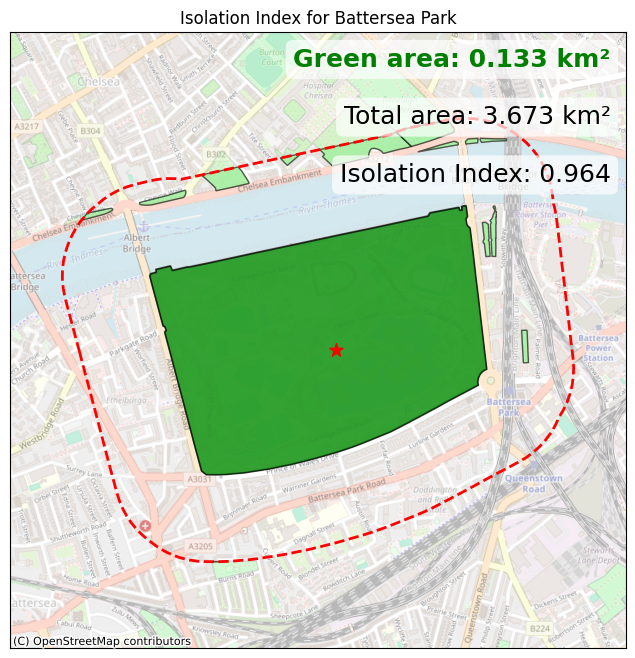

Isolation Index for Bishop's Park (500 buffer): 0.9175188667849735


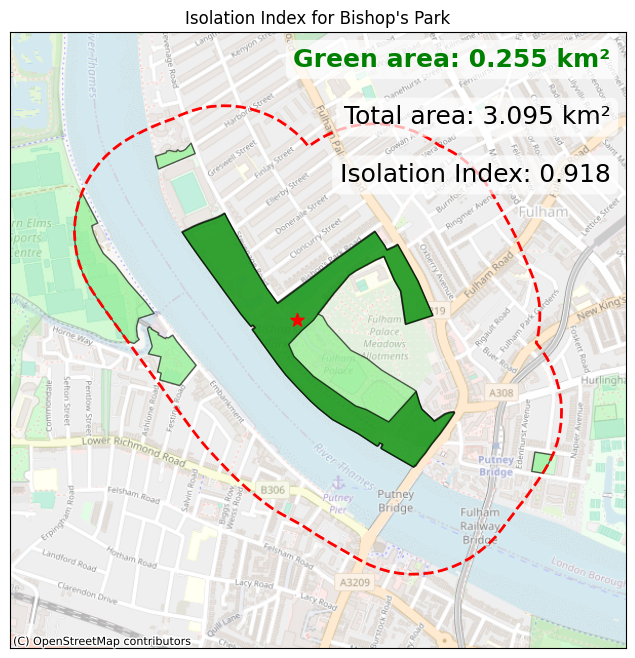

Isolation Index for Brompton Park (500 buffer): 0.7380623024060351


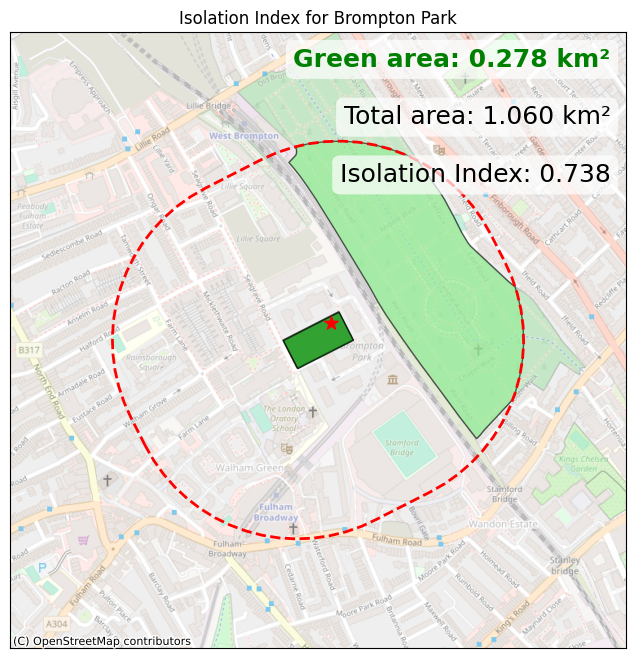

Isolation Index for Clapham Common (500 buffer): 0.9971387386818787


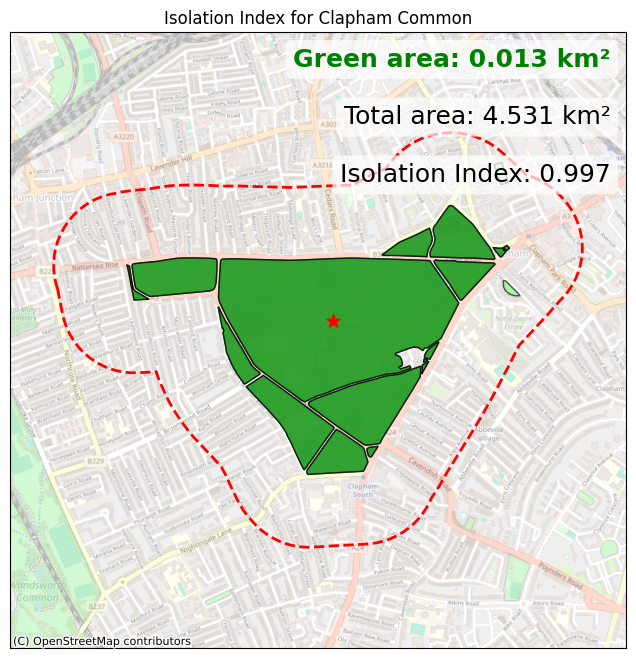

Isolation Index for Greenwich Park (500 buffer): 0.6693129038689607


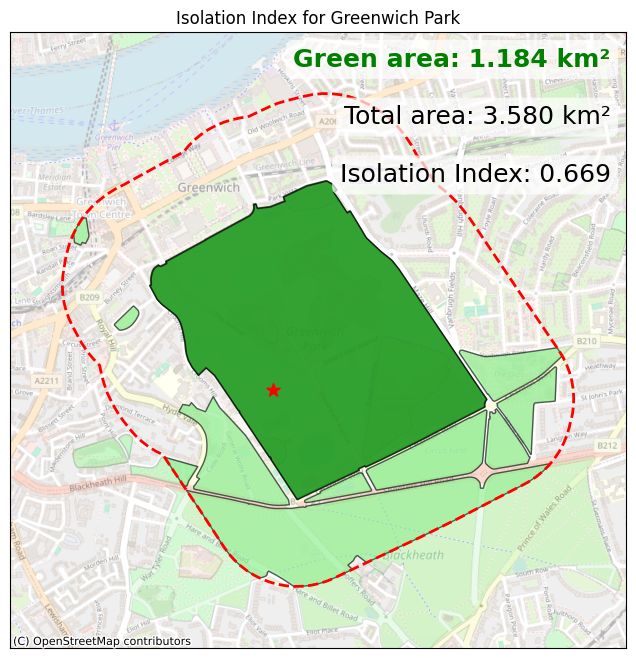

Isolation Index for Hampstead Heath (500 buffer): 0.9863206666888001


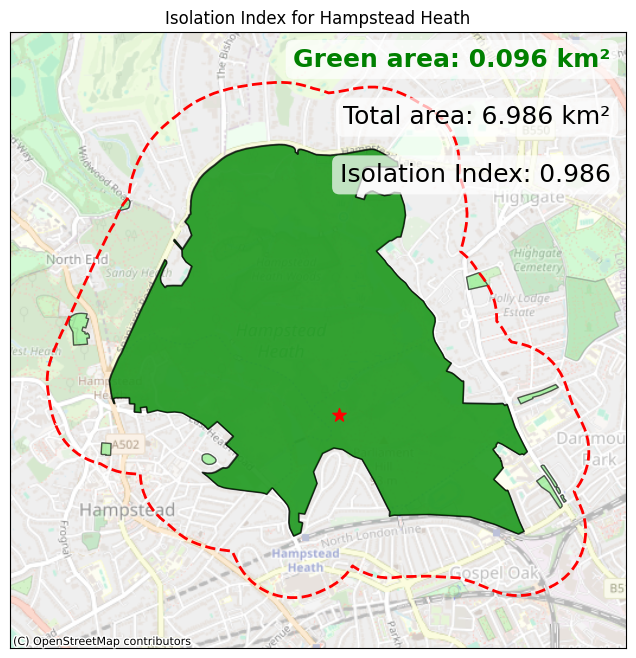

Isolation Index for Holland Park (500 buffer): 0.9721111426628594


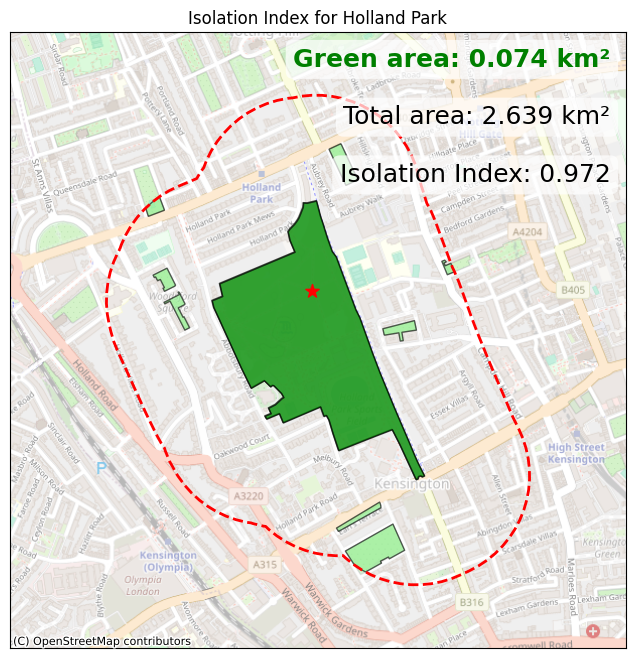

Isolation Index for Hyde Park (500 buffer): 0.7254402278360965


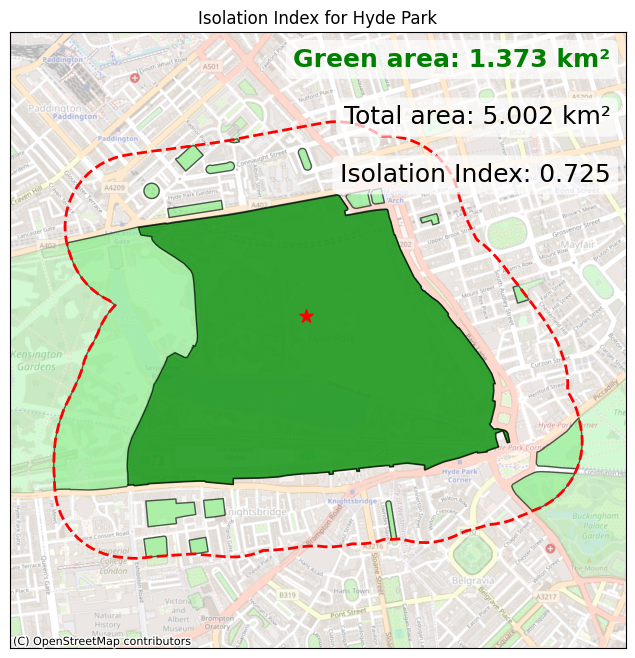

Isolation Index for Kensington Gardens (500 buffer): 0.709629805951032


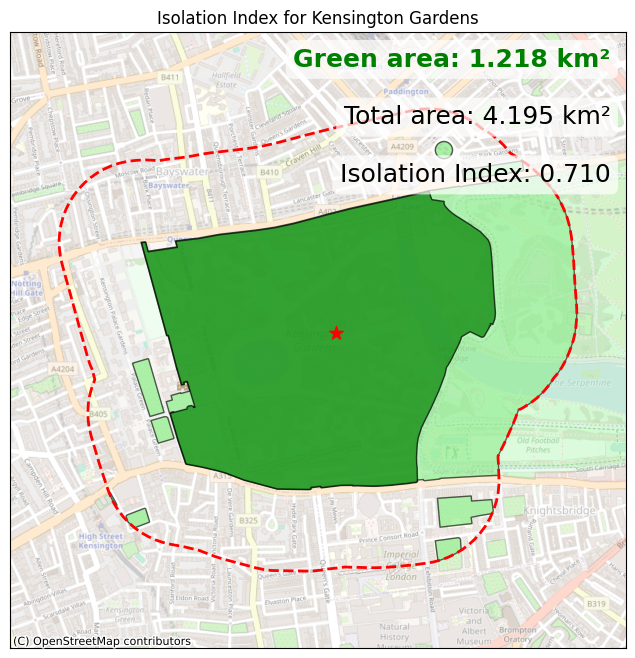

Isolation Index for Mudchute Park & Farm (500 buffer): 0.885899878305372


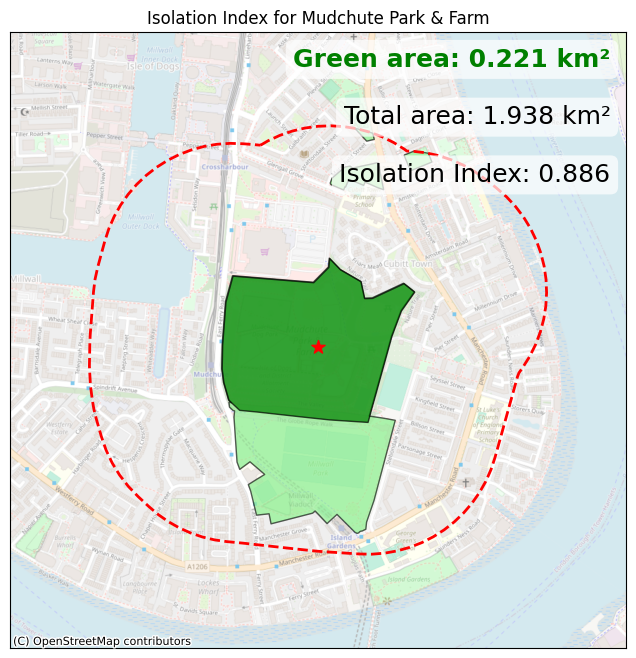

Isolation Index for Oratory House Garden (500 buffer): 0.8874118867853146


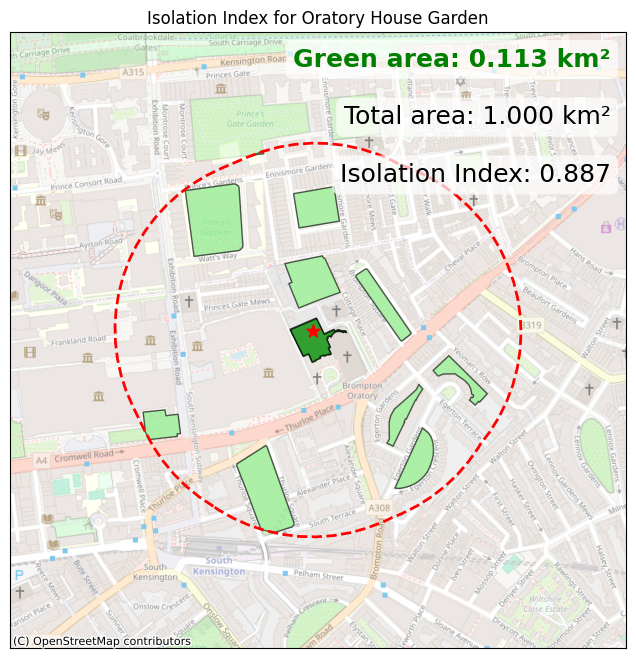

Isolation Index for Prince's Gardens (500 buffer): 0.8281461593589932


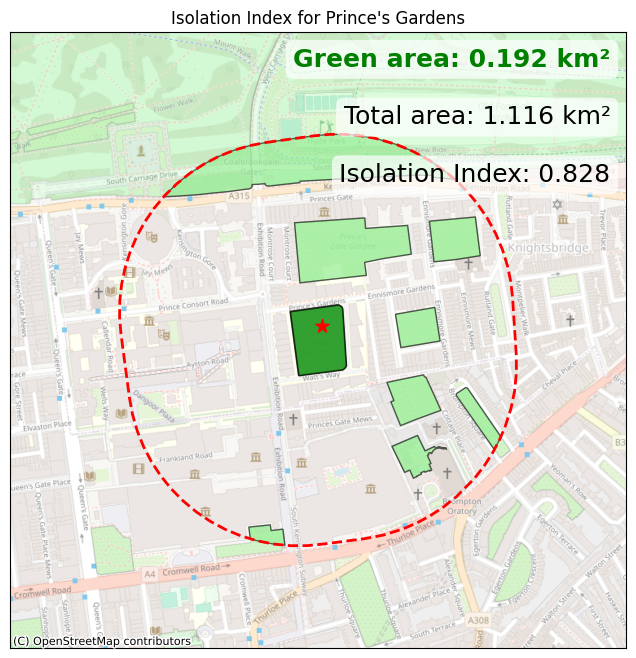

Isolation Index for Prince's Gate Garden (500 buffer): 0.6242107120663785


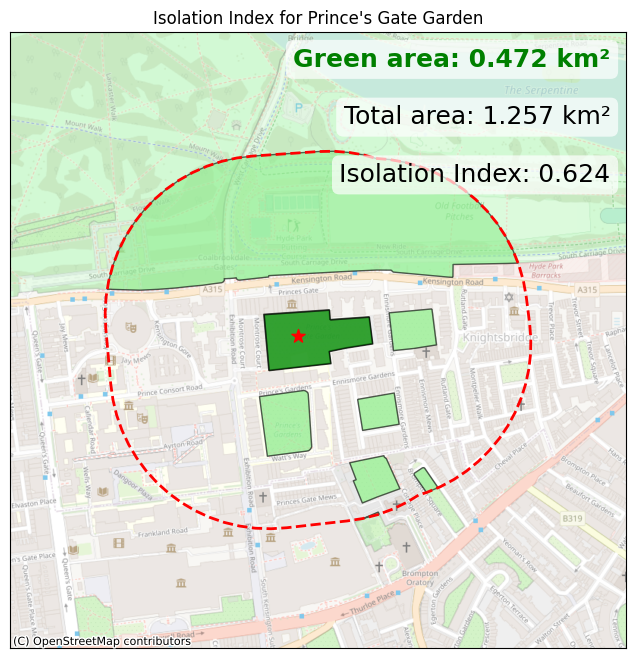

Isolation Index for Putney Heath (500 buffer): 0.6880643383141165


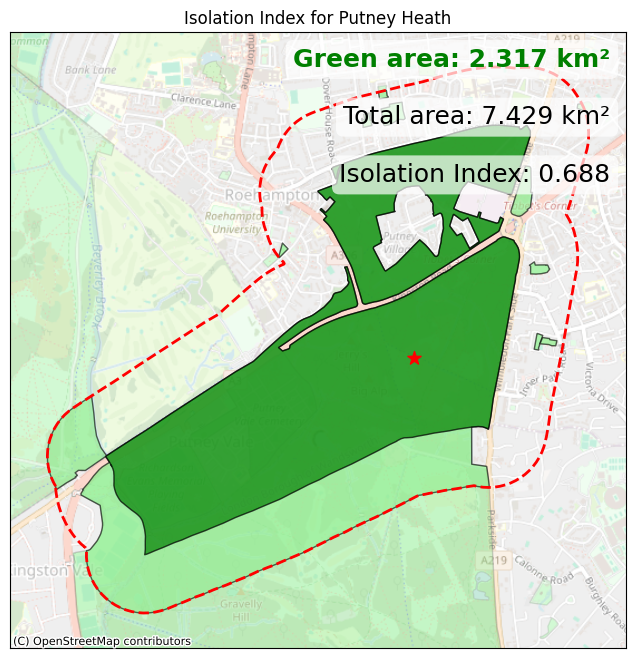

Isolation Index for Richmond Park (500 buffer): 0.7438648274092


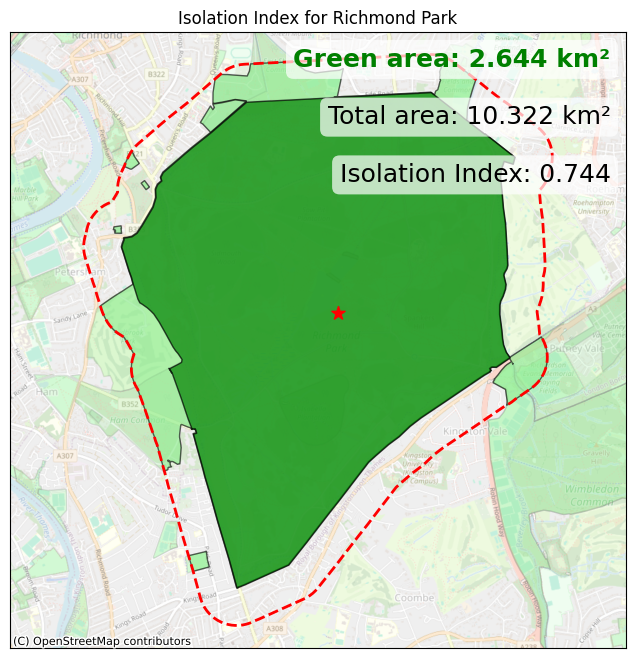

Isolation Index for Russell Square (500 buffer): 0.9205629239154438


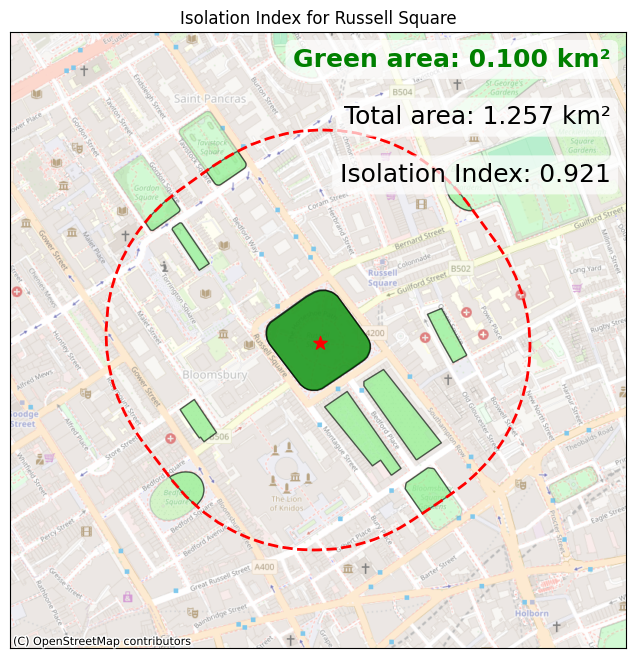

Isolation Index for Soho Square Gardens (500 buffer): 0.9929410316676385


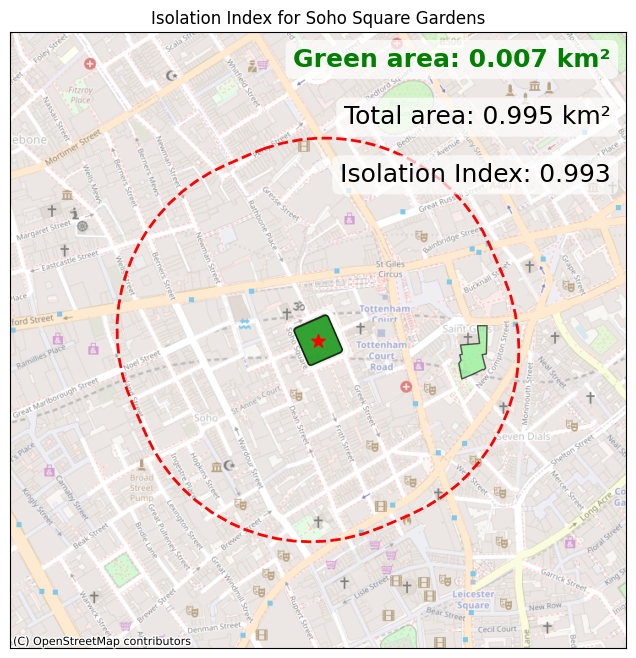

Isolation Index for St. James's Park (500 buffer): 0.8725352061127167


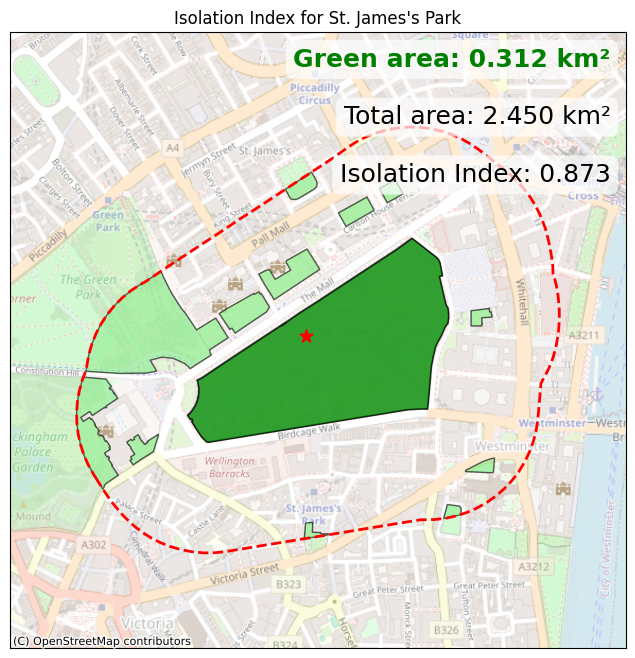

Isolation Index for The Regent's Park (500 buffer): 0.8881042090082045


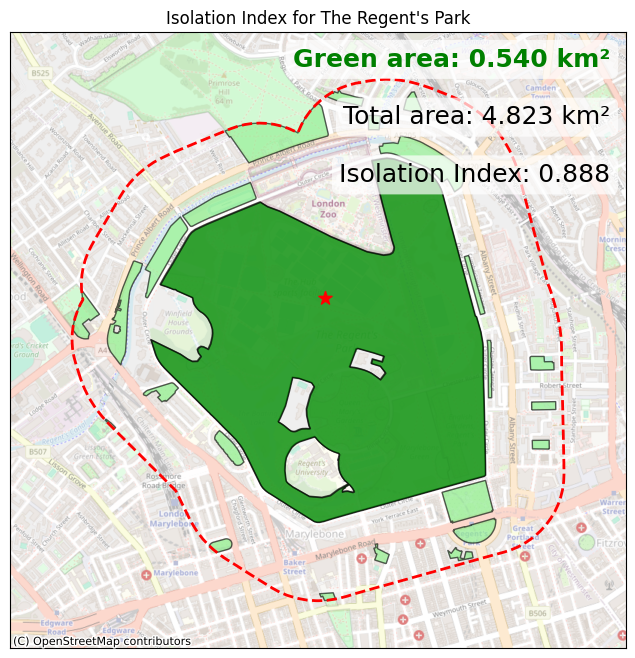

Isolation Index for Whitehall Garden (500 buffer): 0.9600658850626994


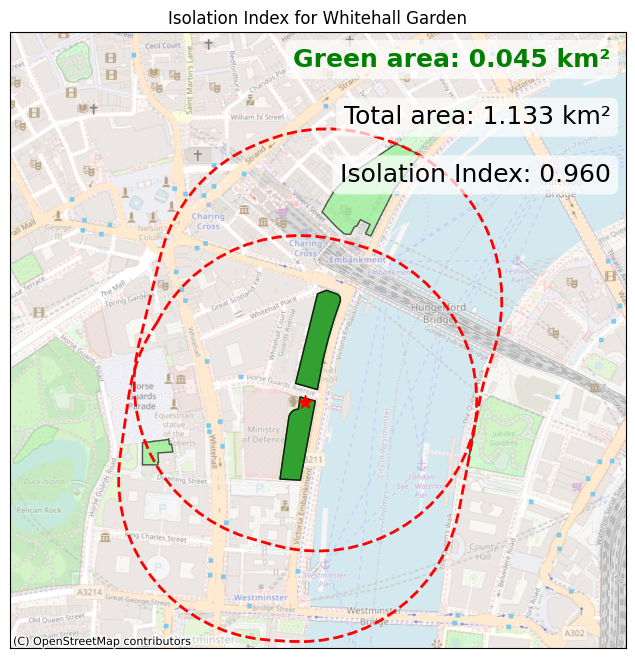

{'Battersea Park': np.float64(0.9636634265455684), "Bishop's Park": np.float64(0.9175188667849735), 'Brompton Cemetery': np.float64(0.7380623024060351), 'Clapham Common': np.float64(0.9971387386818787), 'Greenwich Park': np.float64(0.6693129038689607), 'Hampstead Heath': np.float64(0.9863206666888001), 'Holland Park': np.float64(0.9721111426628594), 'Hyde Park': np.float64(0.7254402278360965), 'Kensington Garden': np.float64(0.709629805951032), 'Mudchute Park': np.float64(0.885899878305372), 'Oratory Gardens': np.float64(0.8874118867853146), "Prince's Gardens": np.float64(0.8281461593589932), "Imperial College Secret Garden (Prince's Gate Garden)": np.float64(0.6242107120663785), 'Putney Heath': np.float64(0.6880643383141165), 'Richmond Park': np.float64(0.7438648274092), 'Russell Square': np.float64(0.9205629239154438), 'Soho Square': np.float64(0.9929410316676385), "St James's Park": np.float64(0.8725352061127167), "Regent's Park": np.float64(0.8881042090082045), 'Victoria Embankment

In [8]:
isolation_indexes = {}

for index, park in joined_clean.iterrows():
  isolation_index = calculate_isolation_index(park["name_right"], 500, park["geometry"])
  isolation_indexes[park["name_left"]] = isolation_index

print(isolation_indexes)

In [9]:
import csv
import numpy as np
from sklearn.preprocessing import MinMaxScaler

values = np.array(list(isolation_indexes.values())).reshape(-1, 1)
scaler = MinMaxScaler()
scaled_values = scaler.fit_transform(values).flatten()

scaled_isolation_indexes = dict(zip(isolation_indexes.keys(), scaled_values))
print(scaled_isolation_indexes)

with open('scaled_isolation_index.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Park', 'Scaled Isolation Index'])
    for park, value in scaled_isolation_indexes.items():
        writer.writerow([park, value])

{'Battersea Park': np.float64(0.9102365342714656), "Bishop's Park": np.float64(0.7865007019732637), 'Brompton Cemetery': np.float64(0.30529105407527046), 'Clapham Common': np.float64(1.0), 'Greenwich Park': np.float64(0.12094074079630346), 'Hampstead Heath': np.float64(0.9709915286033666), 'Holland Park': np.float64(0.9328889377230327), 'Hyde Park': np.float64(0.27144518122819616), 'Kensington Garden': np.float64(0.22904981065615404), 'Mudchute Park': np.float64(0.7017149357583752), 'Oratory Gardens': np.float64(0.705769360129922), "Prince's Gardens": np.float64(0.5468493455518111), "Imperial College Secret Garden (Prince's Gate Garden)": np.float64(0.0), 'Putney Heath': np.float64(0.17122238526087763), 'Richmond Park': np.float64(0.32085042368292793), 'Russell Square': np.float64(0.7946632880843065), 'Soho Square': np.float64(0.9887439218437497), "St James's Park": np.float64(0.6658778003359025), "Regent's Park": np.float64(0.7076258100974213), 'Victoria Embankment Gardens: Whitehall 

What follows is some extra visualizations not used in the report

Isolation Index for Prince's Gardens (500 buffer): 0.8281461593589932
Isolation Index for Putney Heath (500 buffer): 0.6880643383141165


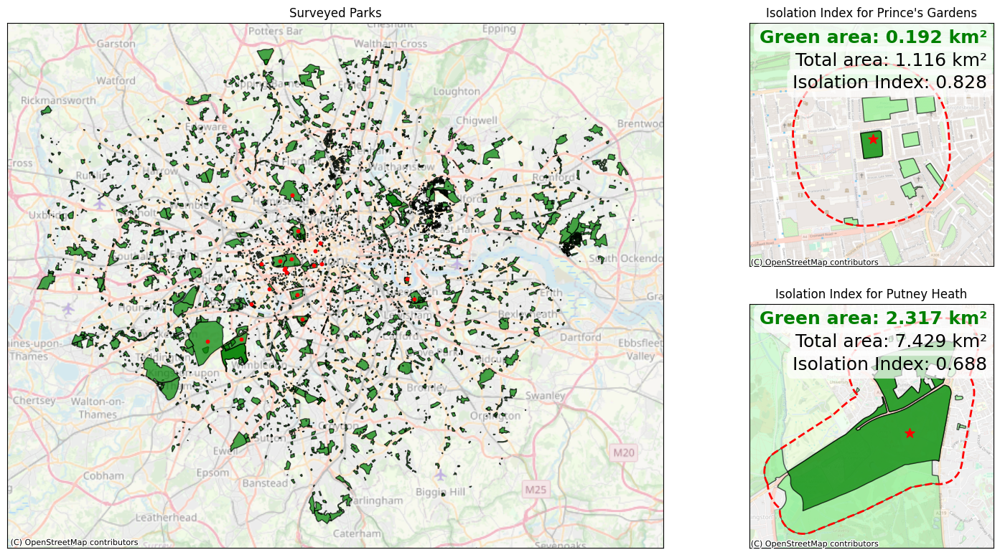

In [10]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import contextily as ctx

fig = plt.figure(figsize=(15, 8))
gs = gridspec.GridSpec(2, 2, width_ratios=[2, 1])

parks = list(joined.itertuples())

ax1 = fig.add_subplot(gs[:, 0])
filtered.plot(ax=ax1, color='green', alpha=0.7, edgecolor='black')
points_gdf.to_crs(filtered.crs).plot(
    ax=ax1, facecolors='red', marker="o", markersize=10)
ax1.set_title(f"Surveyed Parks")
ax1.set_aspect('equal')
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
ctx.add_basemap(ax1, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.5)

park2 = parks[1]
calculate_isolation_index(park2.name_right, 500, park2.geometry, ax=fig.add_subplot(gs[0, 1]))

park3 = parks[9]
calculate_isolation_index(park3.name_right, 500, park3.geometry, ax=fig.add_subplot(gs[1, 1]))

plt.tight_layout()
plt.show()